In [50]:
import pandas as pd
import chart_studio.plotly as py 
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, plot 
import json
import os
import matplotlib.pyplot as plt

In [4]:
dataset_forecast = pd.read_csv('C:\\Users\\souja\\Desktop\\codechef_covid19\\datasets\\covid19-global-forecasting-week-1\\train.csv')

In [5]:
dataset_forecast.head()

,Id,Province/State,Country/Region,Lat,Long,Date,ConfirmedCases,Fatalities
0,1,NaN,Afghanistan,33.0,65.0,2020-01-22,0.0,0.0
1,2,NaN,Afghanistan,33.0,65.0,2020-01-23,0.0,0.0
2,3,NaN,Afghanistan,33.0,65.0,2020-01-24,0.0,0.0
3,4,NaN,Afghanistan,33.0,65.0,2020-01-25,0.0,0.0
4,5,NaN,Afghanistan,33.0,65.0,2020-01-26,0.0,0.0


In [6]:
#countries
dataset_forecast['Country/Region'].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Benin', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chile', 'China', 'Colombia',
       'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cruise Ship', 'Cuba', 'Cyprus',
       'Czechia', 'Denmark', 'Djibouti', 'Dominican Republic', 'Ecuador',
       'Egypt', 'Equatorial Guinea', 'Estonia', 'Eswatini', 'Ethiopia',
       'Finland', 'France', 'French Guiana', 'Gabon', 'Gambia, The',
       'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland', 'Guadeloupe',
       'Guam', 'Guatemala', 'Guernsey', 'Guinea', 'Guyana', 'Holy See',
       'Honduras', 'Hungary', 'Iceland', 'India', 'Indonesia

In [7]:
dataset_forecast.dropna()['Country/Region'].unique()

array(['Australia', 'Canada', 'China', 'Cruise Ship', 'Denmark', 'France',
       'Netherlands', 'US', 'United Kingdom'], dtype=object)

## Ploting based on the severity of confirmed active on the based of latest date

In [8]:
max(dataset_forecast['Date'])

'2020-03-23'

In [9]:
data_china = dataset_forecast[dataset_forecast['Date'] == max(dataset_forecast['Date'])][dataset_forecast['Country/Region'] == 'China']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [10]:
data_china.head()

,Id,Province/State,Country/Region,Lat,Long,Date,ConfirmedCases,Fatalities
2975,4433,Anhui,China,31.8257,117.2264,2020-03-23,990.0,6.0
3037,4526,Beijing,China,40.1824,116.4142,2020-03-23,537.0,8.0
3099,4619,Chongqing,China,30.0572,107.8740,2020-03-23,577.0,6.0
3161,4712,Fujian,China,26.0789,117.9874,2020-03-23,313.0,1.0
3223,4805,Gansu,China,37.8099,101.0583,2020-03-23,136.0,2.0


In [11]:
data_china_to_plot = data_china[['Province/State','ConfirmedCases','Fatalities']]

In [12]:
data_china_to_plot.head()

,Province/State,ConfirmedCases,Fatalities
2975,Anhui,990.0,6.0
3037,Beijing,537.0,8.0
3099,Chongqing,577.0,6.0
3161,Fujian,313.0,1.0
3223,Gansu,136.0,2.0


In [13]:
data_china_to_plot['Active'] = data_china_to_plot['ConfirmedCases'] - data_china_to_plot['Fatalities']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [14]:
data_china_to_plot

,Province/State,ConfirmedCases,Fatalities,Active
2975,Anhui,990.0,6.0,984.0
3037,Beijing,537.0,8.0,529.0
3099,Chongqing,577.0,6.0,571.0
3161,Fujian,313.0,1.0,312.0
3223,Gansu,136.0,2.0,134.0
3285,Guangdong,1415.0,8.0,1407.0
3347,Guangxi,254.0,2.0,252.0
3409,Guizhou,146.0,2.0,144.0
3471,Hainan,168.0,6.0,162.0
3533,Hebei,319.0,6.0,313.0


In [15]:
with open(os.getcwd()+'\\extras\\china\\geojson_china.json') as f:
  map_china = json.load(f)

##### Active

In [16]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_china,locations=data_china_to_plot['Province/State'],z=data_china_to_plot['Active'],
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))

In [17]:
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 35.8617, "lon": 104.1954})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

##### Deaths

In [18]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_china,locations=data_china_to_plot['Province/State'],z=data_china_to_plot['Fatalities'],
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))

In [19]:
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 35.8617, "lon": 104.1954})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

#### Creating Cluster for China

In [20]:
from sklearn.cluster import KMeans

In [21]:
### cluster for the diseases
### 3 - not likely unsafe 1 - unsafe 0 - likely unsafe
model = KMeans(n_clusters=3)
model.fit(data_china_to_plot['Active'].values.reshape(-1,1))

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [22]:
model.cluster_centers_

array([[  121.22727273],
       [64647.        ],
       [  861.1       ]])

In [25]:
data_china_all = dataset_forecast[dataset_forecast['Country/Region'] == 'China']

In [26]:
data_china_all

,Id,Province/State,Country/Region,Lat,Long,Date,ConfirmedCases,Fatalities
2914,4372,Anhui,China,31.8257,117.2264,2020-01-22,1.0,0.0
2915,4373,Anhui,China,31.8257,117.2264,2020-01-23,9.0,0.0
2916,4374,Anhui,China,31.8257,117.2264,2020-01-24,15.0,0.0
2917,4375,Anhui,China,31.8257,117.2264,2020-01-25,39.0,0.0
2918,4376,Anhui,China,31.8257,117.2264,2020-01-26,60.0,0.0
...,...,...,...,...,...,...,...,...
4955,7405,Zhejiang,China,29.1832,120.0934,2020-03-19,1233.0,1.0
4956,7406,Zhejiang,China,29.1832,120.0934,2020-03-20,1234.0,1.0
4957,7407,Zhejiang,China,29.1832,120.0934,2020-03-21,1236.0,1.0
4958,7408,Zhejiang,China,29.1832,120.0934,2020-03-22,1237.0,1.0


In [27]:
data_china_all['Active'] = data_china_all['ConfirmedCases'] - data_china_all['Fatalities']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
data_china_all = data_china_all.drop(['Province/State','Country/Region','Lat','Long','ConfirmedCases','Id'],axis=1)

In [39]:
data_china_all = data_china_all.groupby('Date').sum().reset_index()

In [51]:
fig = plt.figure(figsize=(150,150))
plt.plot(data_china_all['Date'],data_china_all['Active'])

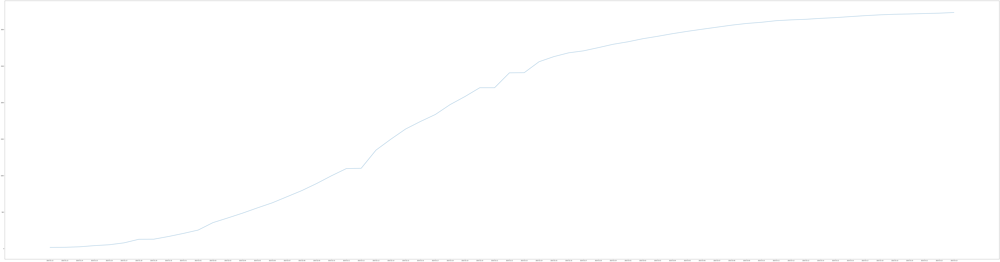

In [52]:
fig = plt.figure(figsize=(150,40))
plt.plot(data_china_all['Date'],data_china_all['Fatalities'])

#### India

In [72]:
data_india = pd.read_csv(os.getcwd()+'\\datasets\\india\\india.csv')

In [73]:
data_india

,Date,Name of State / UT,Total Confirmed cases (Indian National),Total Confirmed cases ( Foreign National ),Cured/Discharged/Migrated,Latitude,Longitude,Death,Total Confirmed cases
0,2020-01-30,Kerala,1,0,0,10.8505,76.2711,0,1
1,2020-01-31,Kerala,1,0,0,10.8505,76.2711,0,1
2,2020-02-01,Kerala,2,0,0,10.8505,76.2711,0,2
3,2020-02-02,Kerala,3,0,0,10.8505,76.2711,0,3
4,2020-02-03,Kerala,3,0,0,10.8505,76.2711,0,3
...,...,...,...,...,...,...,...,...,...
608,2020-04-03,Tamil Nadu,0,0,6,11.1271,78.6569,1,309
609,2020-04-03,Telengana,0,0,1,18.1124,79.0193,3,107
610,2020-04-03,Uttar Pradesh,0,0,14,26.8467,80.9462,2,113
611,2020-04-03,Uttarakhand,0,0,2,30.0668,79.0193,0,10


In [107]:
data_india_to_plot = data_india[data_india['Date'] == max(data_india['Date'])]

In [108]:
data_india_to_plot = data_india_to_plot.drop(['Date','Total Confirmed cases (Indian National)','Total Confirmed cases ( Foreign National )','Cured/Discharged/Migrated','Latitude','Longitude'],axis=1)

In [109]:
data_india_to_plot['Active'] = data_india_to_plot['Total Confirmed cases'] - data_india_to_plot['Death']

In [110]:
data_india_to_plot

,Name of State / UT,Death,Total Confirmed cases,Active
583,Andaman and Nicobar Islands,0,10,10
584,Andhra Pradesh,1,132,131
585,Arunachal Pradesh,0,1,1
586,Assam,0,16,16
587,Bihar,1,24,23
588,Chandigarh,0,18,18
589,Chhattisgarh,0,9,9
590,Delhi,4,219,215
591,Goa,0,6,6
592,Gujarat,7,87,80


In [111]:
with open(os.getcwd()+'\\extras\\india\\india.json') as f:
  map_ind = json.load(f)

In [115]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_ind,locations=data_india_to_plot['Name of State / UT'].values,z=data_india_to_plot['Active'].values,
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 28.49401, "lon": 81.837451})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [114]:
data_india_to_plot['Name of State / UT'].values

array(['Andaman and Nicobar Islands', 'Andhra Pradesh',
       'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh',
       'Chhattisgarh', 'Delhi', 'Goa', 'Gujarat', 'Haryana',
       'Himachal Pradesh', 'Jammu and Kashmir', 'Jharkhand', 'Karnataka',
       'Kerala', 'Ladakh', 'Madhya Pradesh', 'Maharashtra', 'Manipur',
       'Mizoram', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan',
       'Tamil Nadu', 'Telengana', 'Uttar Pradesh', 'Uttarakhand',
       'West Bengal'], dtype=object)

### Creating the same for other countries

#### Australia

In [119]:
data_aus = dataset_forecast[dataset_forecast['Date'] == max(dataset_forecast['Date'])][dataset_forecast['Country/Region'] == 'Australia']
data_aus_to_plot = data_aus[['Province/State','ConfirmedCases','Fatalities']]
with open(os.getcwd()+'\\extras\\aus\\aus.json') as f:
  map_aus = json.load(f)
data_aus_to_plot['Active'] = data_aus_to_plot['ConfirmedCases'] - data_aus_to_plot['Fatalities']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [120]:
data_aus_to_plot

,Province/State,ConfirmedCases,Fatalities,Active
557,Australian Capital Territory,32.0,0.0,32.0
619,From Diamond Princess,0.0,0.0,0.0
681,New South Wales,669.0,6.0,663.0
743,Northern Territory,5.0,0.0,5.0
805,Queensland,319.0,0.0,319.0
867,South Australia,134.0,0.0,134.0
929,Tasmania,28.0,0.0,28.0
991,Victoria,355.0,0.0,355.0
1053,Western Australia,140.0,1.0,139.0


In [121]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_aus,locations=data_aus_to_plot['Province/State'],z=data_aus_to_plot['Active'],
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": -21.363409, "lon": 133.96412})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [122]:
### cluster for the diseases
### 3 - not likely unsafe 1 - unsafe 0 - likely unsafe
model = KMeans(n_clusters=3)
model.fit(data_aus_to_plot['Active'].values.reshape(-1,1))
model.cluster_centers_

array([[ 56.33333333],
       [663.        ],
       [337.        ]])

##### Canada

In [150]:
data_can = dataset_forecast[dataset_forecast['Date'] == max(dataset_forecast['Date'])][dataset_forecast['Country/Region'] == 'Canada']
data_can_to_plot = data_can[['Province/State','ConfirmedCases','Fatalities']]
with open(os.getcwd()+'\\extras\\canada\\canada.json') as f:
  map_can = json.load(f)
data_can_to_plot['Active'] = data_can_to_plot['ConfirmedCases'] - data_can_to_plot['Fatalities']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [151]:
data_can_to_plot

,Province/State,ConfirmedCases,Fatalities,Active
2169,Alberta,301.0,1.0,300.0
2231,British Columbia,472.0,13.0,459.0
2293,Grand Princess,13.0,0.0,13.0
2355,Manitoba,20.0,0.0,20.0
2417,New Brunswick,17.0,0.0,17.0
2479,Newfoundland and Labrador,24.0,0.0,24.0
2541,Nova Scotia,0.0,0.0,0.0
2603,Ontario,503.0,6.0,497.0
2665,Prince Edward Island,3.0,0.0,3.0
2727,Quebec,628.0,4.0,624.0


In [152]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_can,locations=data_can_to_plot['Province/State'],z=data_can_to_plot['Active'],
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 62.59193, "lon": -110.019173})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [138]:
### cluster for the diseases
### 3 - not likely unsafe 1 - unsafe 0 - likely unsafe
model = KMeans(n_clusters=3)
model.fit(data_can_to_plot['Active'].values.reshape(-1,1))
model.cluster_centers_

array([[526.66666667],
       [ 20.42857143],
       [300.        ]])

##### denmark

In [143]:
data_den = dataset_forecast[dataset_forecast['Date'] == max(dataset_forecast['Date'])][dataset_forecast['Country/Region'] == 'Denmark']
data_den_to_plot = data_den[['Province/State','ConfirmedCases','Fatalities']]
with open(os.getcwd()+'\\extras\\denmark\\denmark.json') as f:
  map_den = json.load(f)
data_den_to_plot['Active'] = data_den_to_plot['ConfirmedCases'] - data_den_to_plot['Fatalities']

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

c:\users\souja\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [144]:
data_den_to_plot

,Province/State,ConfirmedCases,Fatalities,Active
5641,Denmark,1450.0,24.0,1426.0
5703,Faroe Islands,118.0,0.0,118.0


In [147]:
fig = go.Figure(go.Choroplethmapbox(geojson=map_den,locations=data_den_to_plot['Province/State'],z=data_den_to_plot['Active'],
                                    colorscale='sunsetdark',
                                    marker_opacity=0.5, marker_line_width=0,colorbar={'title':"No. of Active Cases"}))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 55.609991, "lon": 12.690006})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})